### ECSE 415: Introduction to Computer Vision
### Assignment 1
Imaad Bukhari 

Student ID: 261089801


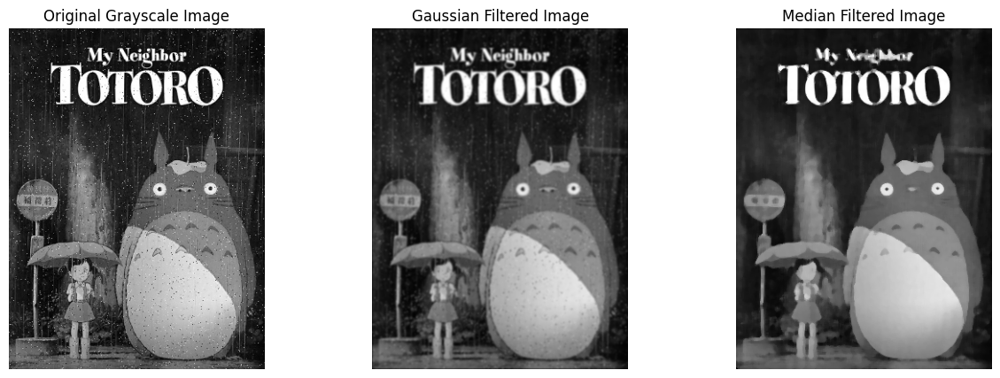

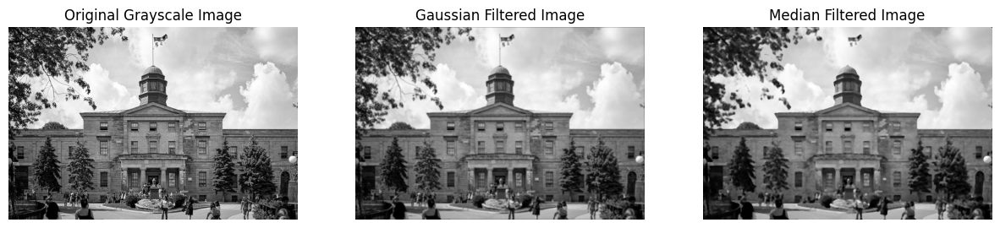

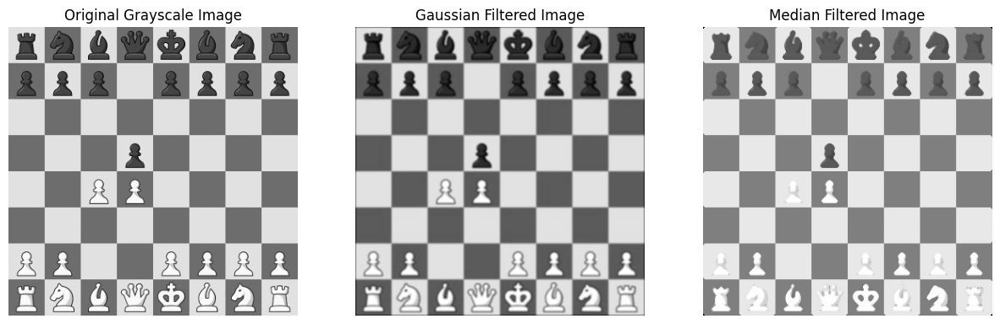

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

#Change this path for marking
path = "/Users/imaadbukhari/Documents/ECSE 415"

#Loads and converts to grayscale
def load_and_convert_image(image_path):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    return image

#My gaussian filter inspired by the one in tutorials
def gaussian_filter(image, kernel_size, sigma):

    k = kernel_size // 2
    x, y = np.mgrid[-k:k+1, -k:k+1]
    kernel = np.exp(-(x**2 + y**2) / (2 * sigma**2))
    kernel /= kernel.sum() 


    padded_image = np.pad(image, k, mode='constant', constant_values=0)
    filtered_image = np.zeros_like(image)

    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            region = padded_image[i:i+kernel_size, j:j+kernel_size]
            filtered_image[i, j] = np.sum(region * kernel)
    
    return filtered_image

#My median filter inspired by the one in tutorials
def median_filter(image, kernel_size):
    k = kernel_size // 2
    padded_image = np.pad(image, k, mode='constant', constant_values=0)
    filtered_image = np.zeros_like(image)

    #Slightly restructured loop from tutorial more intuitive for me
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            region = padded_image[i:i+kernel_size, j:j+kernel_size]
            filtered_image[i, j] = np.median(region)
    
    return filtered_image

def display_images(original, gaussian_filtered, median_filtered):
    plt.figure(figsize=(15, 5))
    
    plt.subplot(1, 3, 1)
    plt.imshow(original, cmap='gray')
    plt.title('Original Grayscale Image')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(gaussian_filtered, cmap='gray')
    plt.title('Gaussian Filtered Image')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(median_filtered, cmap='gray')
    plt.title('Median Filtered Image')
    plt.axis('off')

    plt.show()


grayscale_image = load_and_convert_image(path + '/images/task1.jpg')

gaussian_result = gaussian_filter(grayscale_image, kernel_size=5, sigma=1)
median_result = median_filter(grayscale_image, kernel_size=5)

display_images(grayscale_image, gaussian_result, median_result)

grayscale_image = load_and_convert_image(path + '/images/task2.jpg')

gaussian_result = gaussian_filter(grayscale_image, kernel_size=5, sigma=1)
median_result = median_filter(grayscale_image, kernel_size=5)

display_images(grayscale_image, gaussian_result, median_result)

grayscale_image = load_and_convert_image(path + '/images/task3.jpg')

gaussian_result = gaussian_filter(grayscale_image, kernel_size=5, sigma=1)
median_result = median_filter(grayscale_image, kernel_size=5)

display_images(grayscale_image, gaussian_result, median_result)

#### Questions

1. The Gaussian filter creates fuzzier edges than the Median filter, which generally has quite sharp edges. However, the Gaussian filter preserved the high frequency details far better than the Median filter, especially at larger kernel sizes. In this example, a large kernel reduced how pronounced the pupils, whiskers and letters were with a Median filter, while the Gaussian filter kept them visible/readable albeit with fuzzier edges. 


2. The Median filter was significantly better at eliminating the salt and pepper noise. Even with larger kernel sizes, the Gaussian filter did not really eliminate the noise. It reduced its prominence, but the effect of it was still an uneven, spotty look. This is because of the nature of these filters. The Median filter picks a median value, eliminating outliers, while the Gaussian filter weighs the noise as well, essentially spreading it across the image. 

3. The kernel size dictates how many pixels are taken into account at any point, and the sigma dictates the distribution of how strongly each pixel is considered. The result of this is that higher window sizes and sigma values result in fuzzier edges. The sigma value dictates how strongly high frequency components are shown. At higher sigma values, more detail is lost. 

4. The kernel size in the Median Filter dictates the detail of high frequency components as well as edge definition. At higher values, more pixels are taken into account for each calculation, and the aggregate result of this is an image with less distinguished details/color changes. 


## Canny Edge


(Text(0.5, 1.0, '250,300'), ([], []), ([], []))

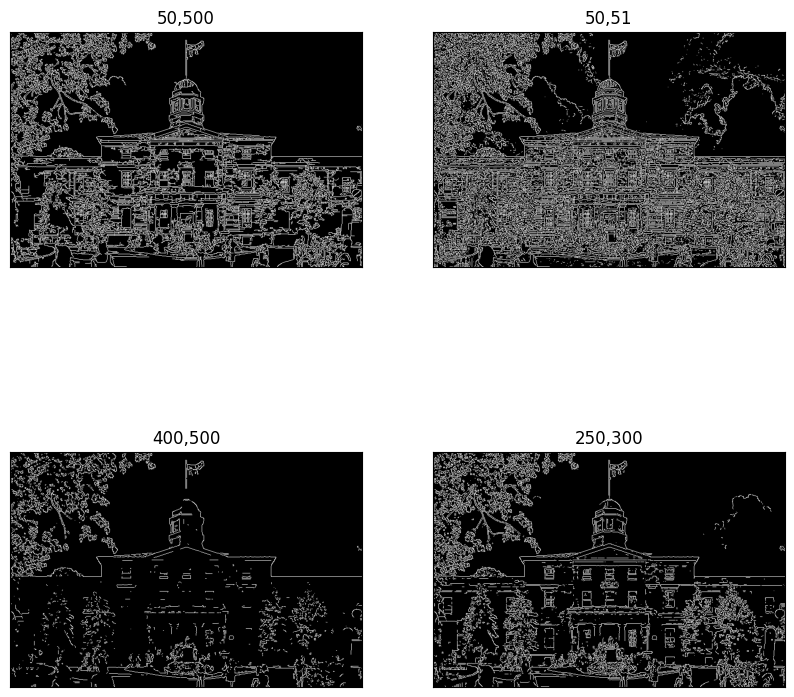

In [ ]:
grayscale_image = load_and_convert_image(path + '/images/task2.jpg')

#Simply applied Canny edge detection
canny_original_1 = cv2.Canny(grayscale_image, 50, 500)
canny_original_2 = cv2.Canny(grayscale_image, 50, 51)
canny_original_3 = cv2.Canny(grayscale_image, 400, 500) 
canny_original_4 = cv2.Canny(grayscale_image, 250, 300)  

plt.figure(figsize=(10, 10))    
plt.subplot(2, 2, 1), plt.imshow(canny_original_1, cmap='gray')
plt.title('50,500'), plt.xticks([]), plt.yticks([])

plt.subplot(2, 2, 2), plt.imshow(canny_original_2, cmap='gray')
plt.title('50,51'), plt.xticks([]), plt.yticks([])

plt.subplot(2, 2, 3), plt.imshow(canny_original_3, cmap='gray')     
plt.title('400,500'), plt.xticks([]), plt.yticks([]) 

plt.subplot(2, 2, 4), plt.imshow(canny_original_4, cmap='gray')     
plt.title('250,300'), plt.xticks([]), plt.yticks([])



#### Effect of Parameters

The parameters for the Canny algorithm work as follows: The second value is a threshold above which edges are taken, and the first value is a threshold above which edges are taken if they are connected to an edge above the second threshold. 

As a result, increasing both parameters reduces the number of edges detected. Keeping the higher one the same and reducing the lower one means that more edges are taken into account. Keeping both low, such as the 50,51 example means that despite the low range, a lot of details/noise is considered. 

(Text(0.5, 1.0, 'Canny Histogram Equalization'), ([], []), ([], []))

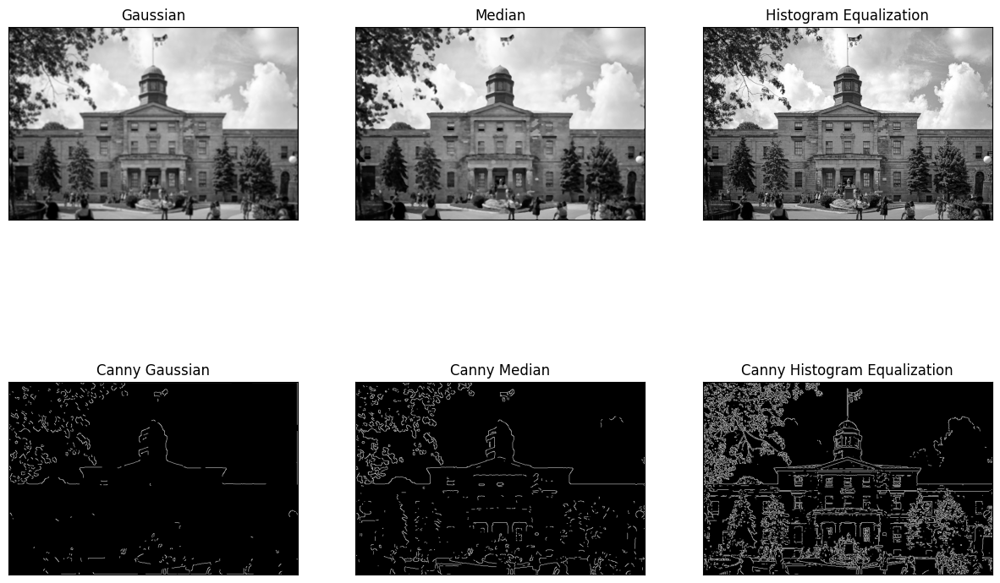

In [ ]:
#Pre Processing

#Wasn't sure whether to use my own filters or the one's in opencv so I used my own
grayscale_image = load_and_convert_image(path + '/images/task2.jpg')
gaussian_result = gaussian_filter(grayscale_image, kernel_size=5, sigma=2)
median_result = median_filter(grayscale_image, kernel_size=5)
histogram_result = cv2.equalizeHist(grayscale_image)

#Applied canny to filtered images
canny_gaussian = cv2.Canny(gaussian_result, 250, 300)
canny_median = cv2.Canny(median_result, 250, 300)
canny_histogram = cv2.Canny(histogram_result, 250, 300)

plt.figure(figsize=(15, 10))

plt.subplot(2, 3, 1), plt.imshow(gaussian_result, cmap='gray')
plt.title('Gaussian'), plt.xticks([]), plt.yticks([])

plt.subplot(2, 3, 2), plt.imshow(median_result, cmap='gray')
plt.title('Median'), plt.xticks([]), plt.yticks([])

plt.subplot(2, 3, 3), plt.imshow(histogram_result, cmap='gray') 
plt.title('Histogram Equalization'), plt.xticks([]), plt.yticks([])

plt.subplot(2, 3, 4), plt.imshow(canny_gaussian, cmap='gray')
plt.title('Canny Gaussian'), plt.xticks([]), plt.yticks([])

plt.subplot(2, 3, 5), plt.imshow(canny_median, cmap='gray')
plt.title('Canny Median'), plt.xticks([]), plt.yticks([])

plt.subplot(2, 3, 6), plt.imshow(canny_histogram, cmap='gray')
plt.title('Canny Histogram Equalization'), plt.xticks([]), plt.yticks([])


(Text(0.5, 1.0, 'Eroded'), ([], []), ([], []))

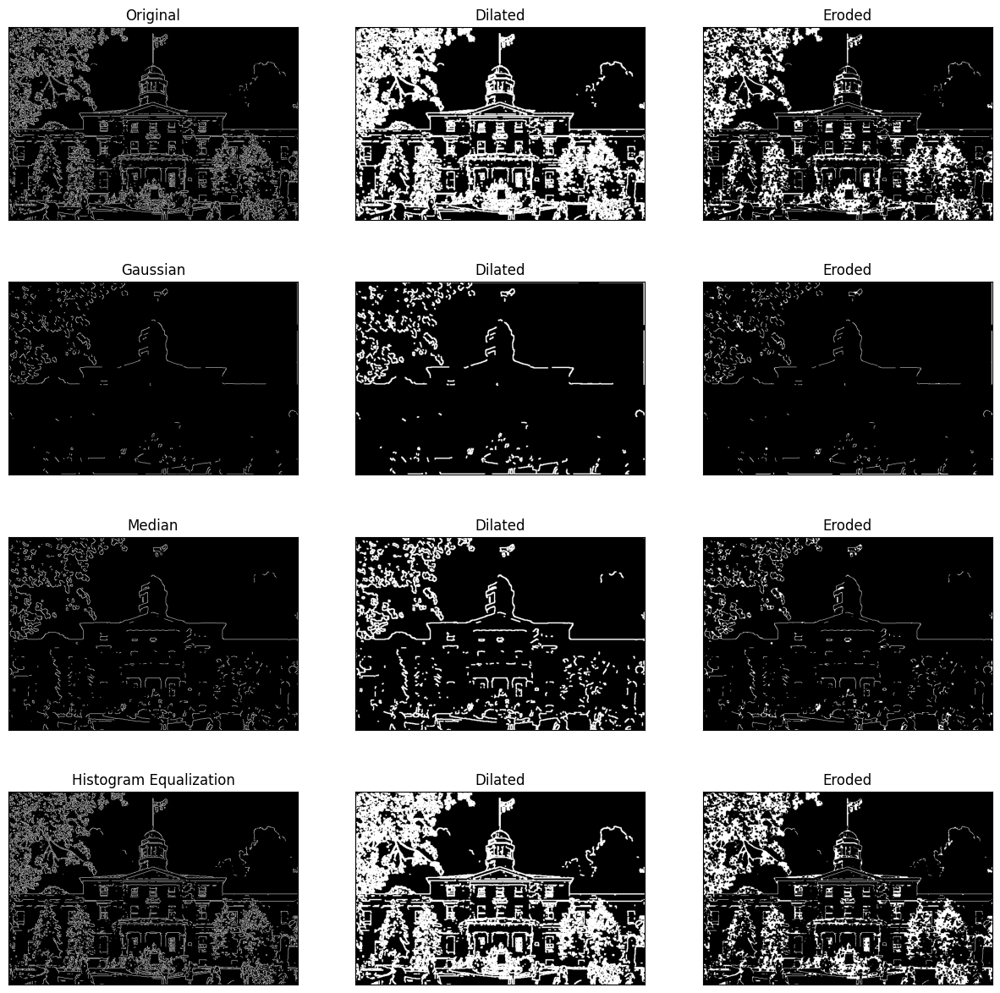

In [ ]:
#Post Processsing

#Created kernel
kernel = np.ones((3,3), np.uint8) 
#Applied to original
edges_dilated = cv2.dilate(canny_original_4, kernel, iterations=1)
edges_eroded = cv2.erode(edges_dilated, kernel, iterations=1)

#Applied to filtered from previous step
edges_dilated_gaussian = cv2.dilate(canny_gaussian, kernel, iterations=1)
edges_eroded_gaussian = cv2.erode(edges_dilated_gaussian, kernel, iterations=1)

edges_dilated_median = cv2.dilate(canny_median, kernel, iterations=1)
edges_eroded_median = cv2.erode(edges_dilated_median, kernel, iterations=1)

edges_dilated_histogram = cv2.dilate(canny_histogram, kernel, iterations=1)
edges_eroded_histogram = cv2.erode(edges_dilated_histogram, kernel, iterations=1)

plt.figure(figsize=(15, 15))
plt.subplot(4, 3, 1), plt.imshow(canny_original_4, cmap='gray')
plt.title('Original'), plt.xticks([]), plt.yticks([])

plt.subplot(4, 3, 2), plt.imshow(edges_dilated, cmap='gray')
plt.title('Dilated'), plt.xticks([]), plt.yticks([])

plt.subplot(4, 3, 3), plt.imshow(edges_eroded, cmap='gray')
plt.title('Eroded'), plt.xticks([]), plt.yticks([])

plt.subplot(4, 3, 4), plt.imshow(canny_gaussian, cmap='gray')
plt.title('Gaussian'), plt.xticks([]), plt.yticks([])

plt.subplot(4, 3, 5), plt.imshow(edges_dilated_gaussian, cmap='gray')
plt.title('Dilated'), plt.xticks([]), plt.yticks([])

plt.subplot(4, 3, 6), plt.imshow(edges_eroded_gaussian, cmap='gray')
plt.title('Eroded'), plt.xticks([]), plt.yticks([])

plt.subplot(4, 3, 7), plt.imshow(canny_median, cmap='gray')
plt.title('Median'), plt.xticks([]), plt.yticks([])
plt.subplot(4, 3, 8), plt.imshow(edges_dilated_median, cmap='gray')
plt.title('Dilated'), plt.xticks([]), plt.yticks([])
plt.subplot(4, 3, 9), plt.imshow(edges_eroded_median, cmap='gray')
plt.title('Eroded'), plt.xticks([]), plt.yticks([])

plt.subplot(4, 3, 10), plt.imshow(canny_histogram, cmap='gray')
plt.title('Histogram Equalization'), plt.xticks([]), plt.yticks([])
plt.subplot(4, 3, 11), plt.imshow(edges_dilated_histogram, cmap='gray')
plt.title('Dilated'), plt.xticks([]), plt.yticks([])
plt.subplot(4, 3, 12), plt.imshow(edges_eroded_histogram, cmap='gray')
plt.title('Eroded'), plt.xticks([]), plt.yticks([])


#### Summary of Findings

Overall, each step of this process was heavily influenced by the parameters used, and I did experiment with a few different combinations. I used the 250-300 threshold for the edge detection for most of the edge detections, as this seemed to give a good balance of finding the important structures without taking in all the noise or overly intricate details for this specific image. 

The pre-processing methods greatly influenced how effective the edge detection was. Gaussian and Median filtering seemed to lose far more detail than histogram equalization. It's worth noting, that's not necessarily a bad thing, as the histogram equalized edges ended up not being too distinguishable from the original. 

Post-processing by dilating to strengthen the edges, then eroding to remove the excess thickness was quite effective when there was enough detail. For the gaussian image, it did not seem to make much of a difference as the edges were not really present enough. The image that seemed to best balance detecting the important edges in this context was the histogram equalized image that was dilated then eroded. 



## Harris Corner Detection


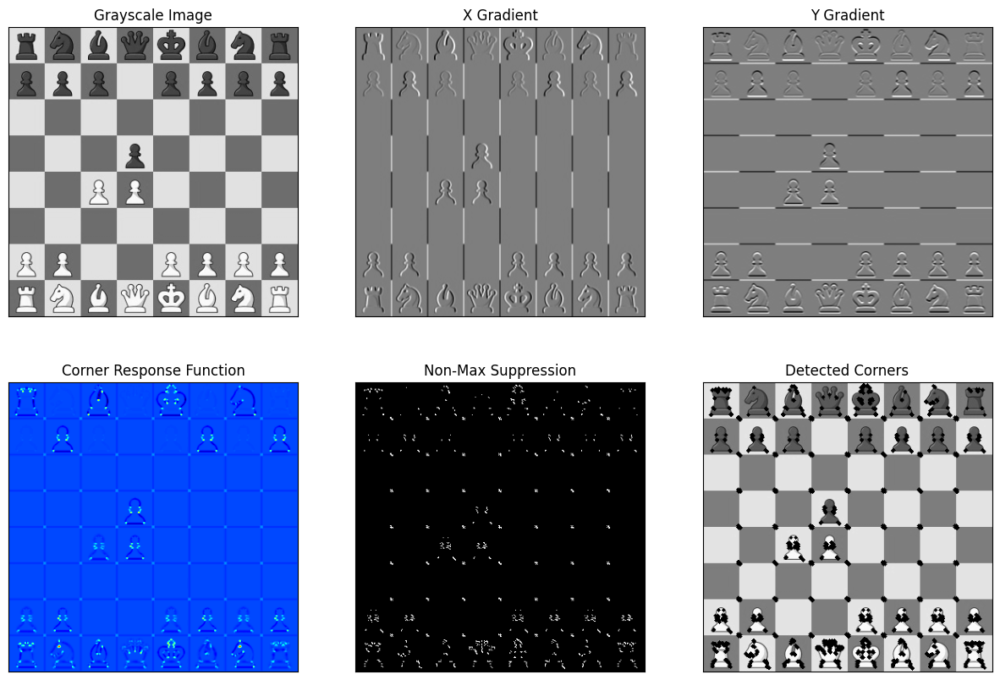

In [ ]:
#Re-declared stuff from previous parts (for some reason it wasn't working unless I did)

import cv2
import numpy as np
import matplotlib.pyplot as plt

path = "/Users/imaadbukhari/Documents/ECSE 415"

def load_and_convert_image(image_path):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    return image

def gaussian_filter(image, kernel_size, sigma):

    k = kernel_size // 2
    x, y = np.mgrid[-k:k+1, -k:k+1]
    kernel = np.exp(-(x**2 + y**2) / (2 * sigma**2))
    kernel /= kernel.sum() 


    padded_image = np.pad(image, k, mode='constant', constant_values=0)
    filtered_image = np.zeros_like(image)

    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            region = padded_image[i:i+kernel_size, j:j+kernel_size]
            filtered_image[i, j] = np.sum(region * kernel)
    
    return filtered_image

grayscale_image = load_and_convert_image(path + '/images/task3.jpg')

#Applied sobel as seen in tutorial 

Ix = cv2.Sobel(grayscale_image, cv2.CV_64F, 1, 0, ksize=3) 
Iy = cv2.Sobel(grayscale_image, cv2.CV_64F, 0, 1, ksize=3)  

Ix2 = Ix ** 2
Iy2 = Iy ** 2
IxIy = Ix * Iy


#Smoothed with my gaussian
smoothed_Ix2 = gaussian_filter(Ix2, kernel_size=3, sigma=1)
smoothed_Iy2 = gaussian_filter(Iy2, kernel_size=3, sigma=1)
smoothed_IxIy = gaussian_filter(IxIy, kernel_size=3, sigma=1)


k = 0.05

M, N = Ix2.shape
Z = np.zeros((M, N), dtype=np.int32)


#Computing corner response function
R_values = np.zeros((M, N))
for i in range(1, M-1):
    for j in range(1, N-1):
        det = (smoothed_Ix2[i, j] * smoothed_Iy2[i, j]) - (smoothed_IxIy[i, j] ** 2)
        trace = smoothed_Ix2[i, j] + smoothed_Iy2[i, j]
        R_values[i, j] = det - k * (trace ** 2)

R_max = np.max(R_values)

#Non-Max Suppression as seen in tutorial

R_angle = np.arctan2(smoothed_Iy2, smoothed_Ix2) * (180.0 / np.pi)
R_angle[R_angle < 0] += 180 
threshold = 0.01 * R_max


for i in range(1, M-1):
    for j in range(1, N-1):
        q, r = 255, 255  

       
        if (0 <= R_angle[i, j] < 22.5) or (157.5 <= R_angle[i, j] <= 180): 
            q = R_values[i, j+1]
            r = R_values[i, j-1]
        elif (22.5 <= R_angle[i, j] < 67.5):  
            q = R_values[i+1, j-1]
            r = R_values[i-1, j+1]
        elif (67.5 <= R_angle[i, j] < 112.5):  
            q = R_values[i+1, j]
            r = R_values[i-1, j]
        elif (112.5 <= R_angle[i, j] < 157.5):  
            q = R_values[i-1, j-1]
            r = R_values[i+1, j+1]

       #Slightly adjusted this part for better visibility
        if (R_values[i, j] >= q) and (R_values[i, j] >= r) and (R_values[i, j] > threshold):
            Z[i, j] = 255 #Z[i, j] = R_values[i, j]
        else:
            Z[i, j] = 0  


corners = np.where(Z > 0)
img_corners = grayscale_image.copy()

for y, x in zip(corners[0], corners[1]):
    cv2.circle(img_corners, (x, y), 2, (0, 255, 0), -1)


plt.figure(figsize=(15, 10))

plt.subplot(231), plt.imshow(grayscale_image, cmap="gray")
plt.title("Grayscale Image"), plt.xticks([]), plt.yticks([])

plt.subplot(232), plt.imshow(Ix, cmap="gray")
plt.title("X Gradient"), plt.xticks([]), plt.yticks([])

plt.subplot(233), plt.imshow(Iy, cmap="gray")
plt.title("Y Gradient"), plt.xticks([]), plt.yticks([])

plt.subplot(234), plt.imshow(R_values, cmap="jet")
plt.title("Corner Response Function"), plt.xticks([]), plt.yticks([])

plt.subplot(235), plt.imshow(Z, cmap="gray")
plt.title("Non-Max Suppression"), plt.xticks([]), plt.yticks([])

plt.subplot(236), plt.imshow(img_corners, cmap="gray")
plt.title("Detected Corners"), plt.xticks([]), plt.yticks([])

plt.show()







#### Summary of Findings on Threshold Values

The threshold value is calculated based on R_max, which one can consider to be the strongest corner. With a threshold of 1* R_max, there are no corners detected as the threshold is set at the maximum. As the threshold gets lower, weaker corners are considered and thus more are detected. 

## SIFT

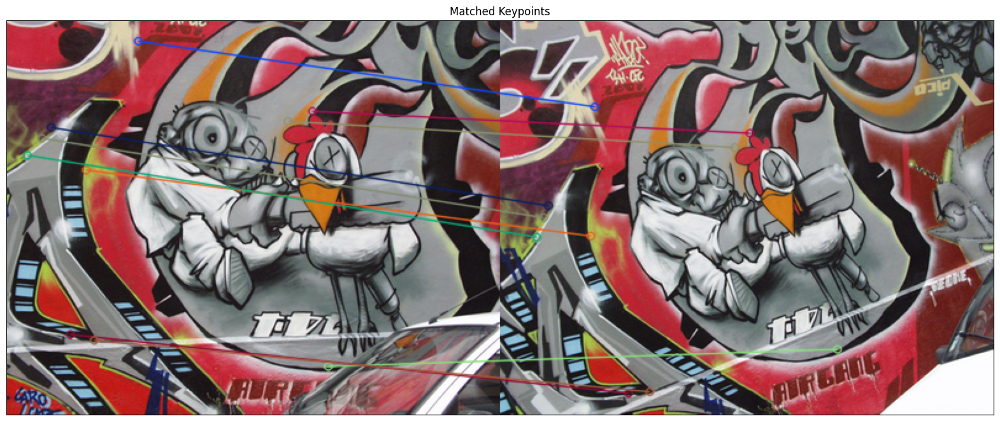

In [ ]:
#Images were loaded and converted

image_1 = cv2.imread(path + '/images/graf1.png')
image_1 = cv2.cvtColor(image_1, cv2.COLOR_BGR2RGB)
image_2 = cv2.imread(path + '/images/graf2.png')
image_2 = cv2.cvtColor(image_2, cv2.COLOR_BGR2RGB)

#largely taken from tutorial
sift = cv2.SIFT_create()
keypoints1, descriptors1 = sift.detectAndCompute(image_1, None)
keypoints2, descriptors2 = sift.detectAndCompute(image_2, None)

brute_force = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)   
matches = brute_force.match(descriptors1, descriptors2)
matches = sorted(matches, key=lambda x: x.distance)

img3 = cv2.drawMatches(image_1, keypoints1, image_2,keypoints2, matches[:10], None, flags= 2)

plt.figure(figsize=(20,20))
plt.imshow(img3)
plt.title("Matched Keypoints"), plt.xticks([]), plt.yticks([])
plt.show()

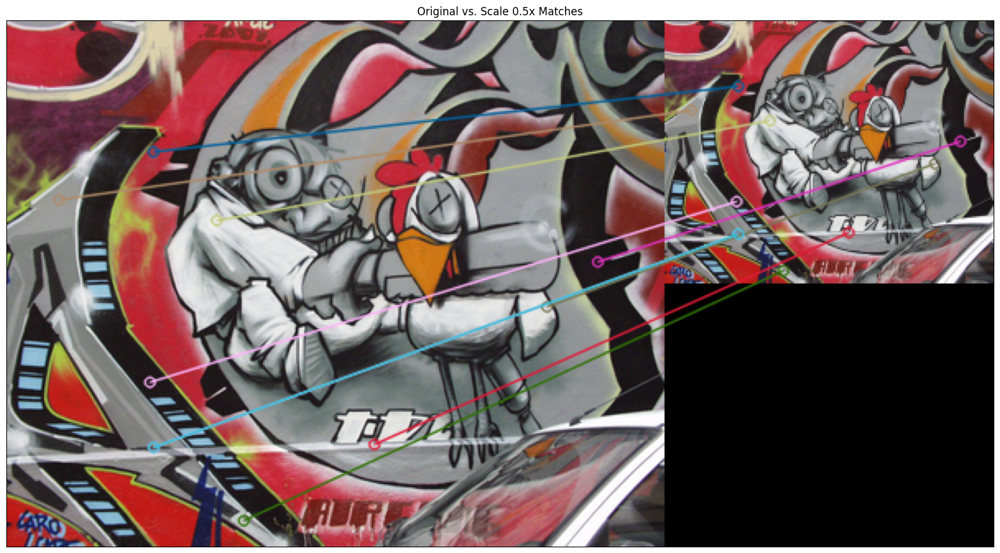

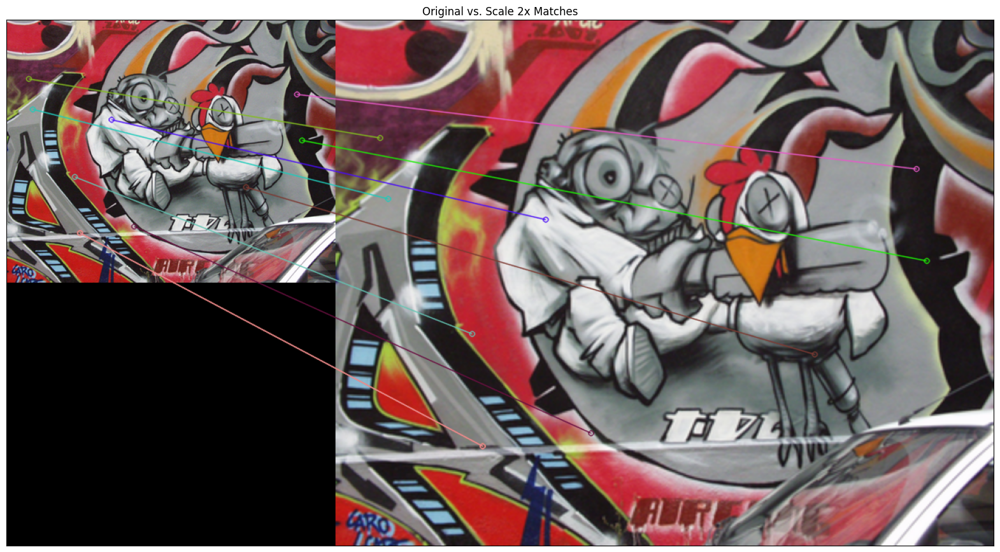

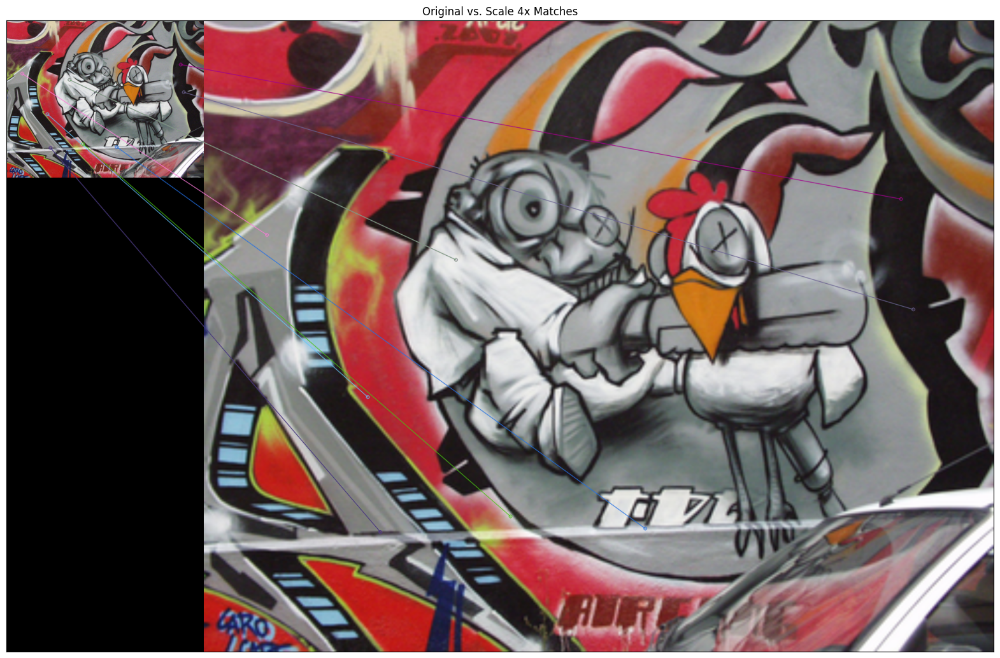

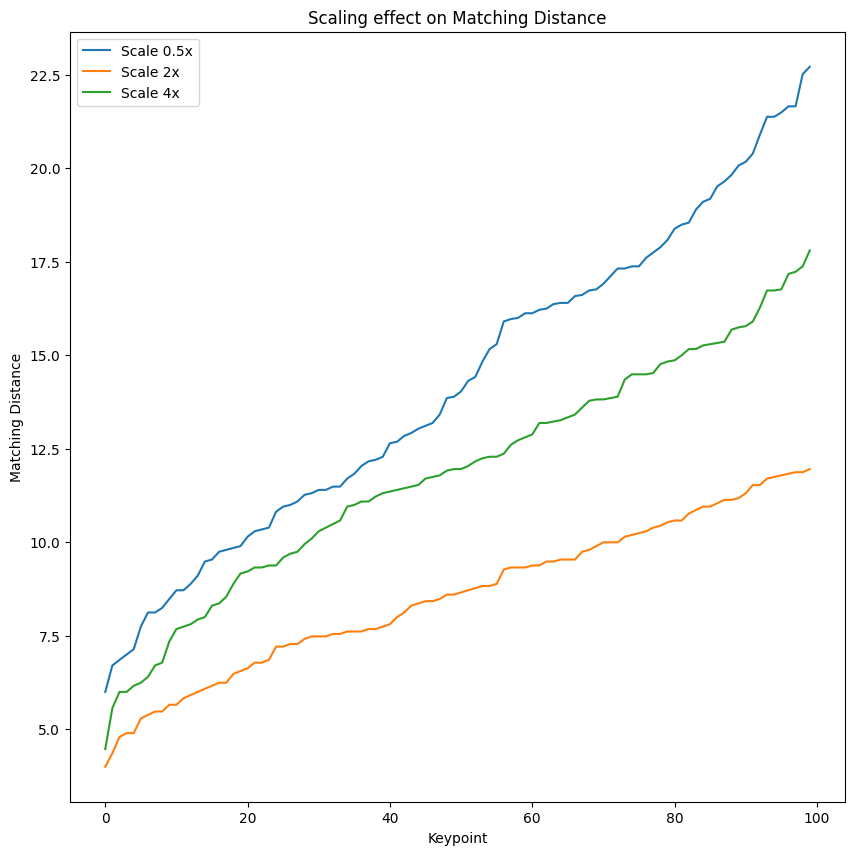

In [ ]:
scales = [0.5, 2, 4]
scale_matches = []

#Also largely inspired by tutorial
for i, scale in enumerate(scales):
    resized_image = cv2.resize(image_1, None, fx=scale, fy=scale)

    keypoints, descriptors = sift.detectAndCompute(resized_image, None)

    matches = brute_force.match(descriptors1, descriptors)
    matches = sorted(matches, key=lambda x: x.distance)
    scale_matches.append([m.distance for m in matches[:100]])
    img = cv2.drawMatches(image_1, keypoints1, resized_image, keypoints, matches[:10], None, flags=2)

    plt.figure(figsize=(20, 20))
    plt.imshow(img)
    plt.title(f"Original vs {scale}"), plt.xticks([]), plt.yticks([])
    plt.show()


plt.figure(figsize=(10, 10))
for i, scale in enumerate(scales):
    plt.plot(range(len(scale_matches[i])), scale_matches[i], label=f"Scale {scale}x")

plt.title("Scaling effect on Matching Distance")
plt.xlabel("Keypoint")
plt.ylabel("Matching Distance")
plt.legend()
plt.show()



#### Effect of Scaling

SIFT is meant to be scale invariant, But in this case it does seem like there was some differences in the matching distance of the scaled images. These differences also seemed to grow with the keypoint index. What can be inferred from this is that in this example, there are some features that were strong enough to be affected less by scaling. 

Additionally, 2x had the lowest matching distance, and 0.5x had the most. The reason this occured and why SIFT was not truly scale invariant in this example comes down to how scaling is done. For 0.5x, the number of pixels is reduced by 50%, and naturally, details are lost that. With 2x and 4x, more pixels are created and the process of doing so requires interpolating what needs to go in them. For 2x, this must not have caused too many discrepancies, but at 4x it was likely that the interpolation caused more details to change and thus affected the matching distance. 

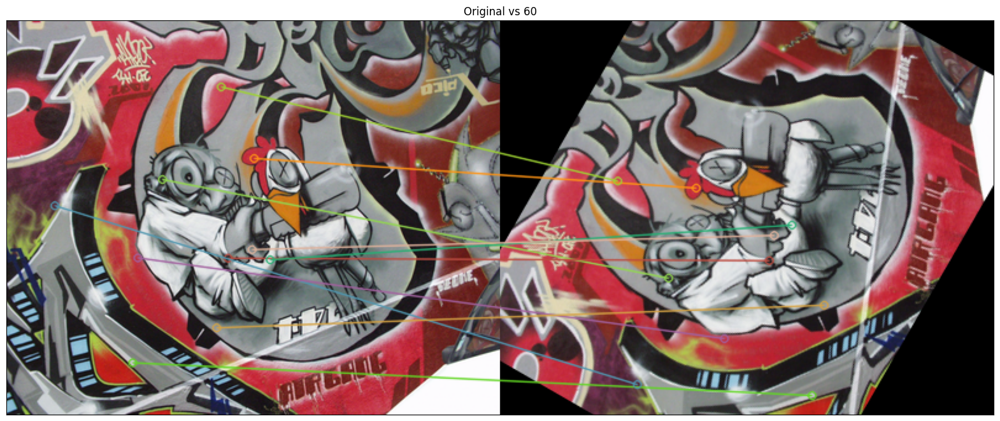

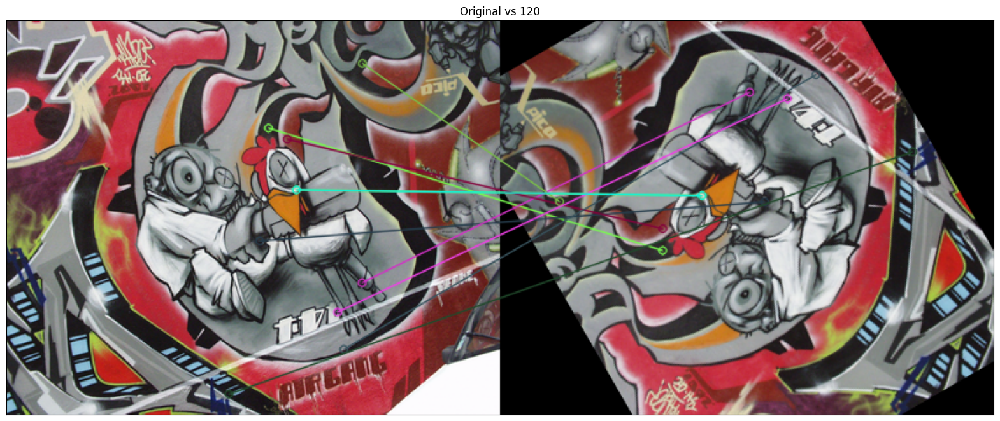

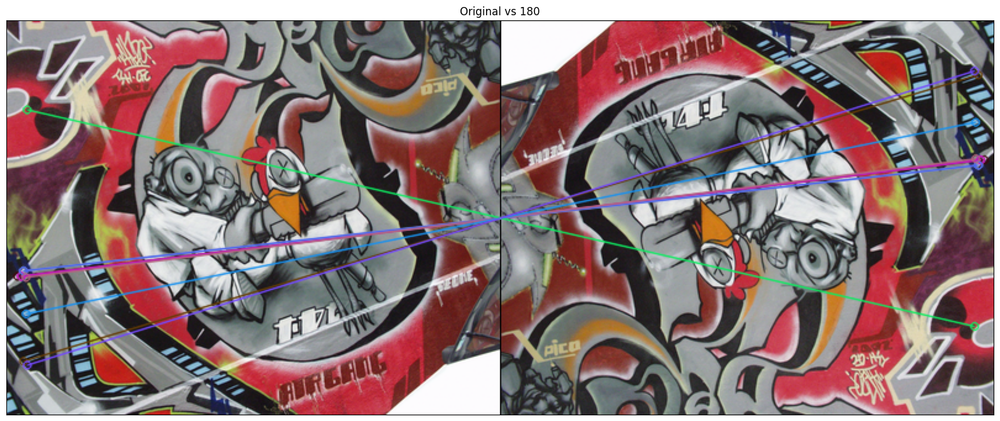

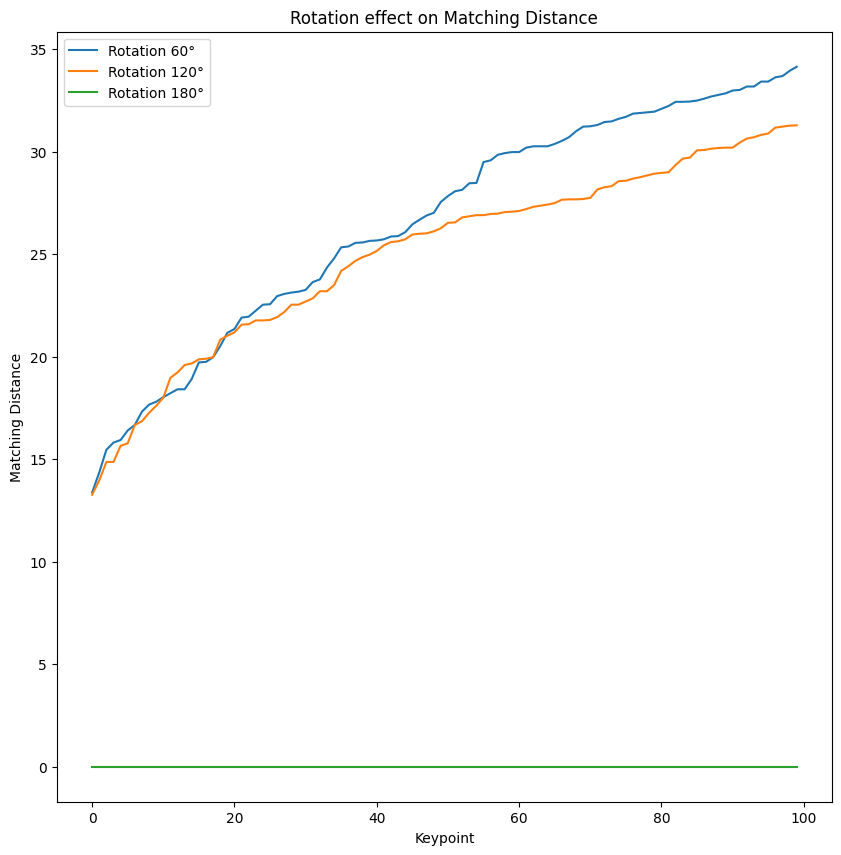

In [ ]:
angles = [60, 120, 180]
rotation_matches = []

#Also largely inspired by tutorial
#Essentially the same as the previous part but with rotation

for i, angle in enumerate(angles):
    h, w,_ = image_2.shape
    Matrix = cv2.getRotationMatrix2D((w / 2, h / 2), angle, 1)
    rotated_image = cv2.warpAffine(image_2, Matrix, (w, h))

    keypoints, descriptors = sift.detectAndCompute(rotated_image, None)

    matches = brute_force.match(descriptors2, descriptors)
    matches = sorted(matches, key=lambda x: x.distance)
    rotation_matches.append([m.distance for m in matches[:100]])
    img = cv2.drawMatches(image_2, keypoints2, rotated_image, keypoints, matches[:10], None, flags=2)

    plt.figure(figsize=(20, 20))
    plt.imshow(img)
    plt.title(f"Original vs {angle}"), plt.xticks([]), plt.yticks([])
    plt.show()

plt.figure(figsize=(10, 10))
for i, angle in enumerate(angles):
    plt.plot(range(len(rotation_matches[i])), rotation_matches[i], label=f"Rotation {angle}°")

plt.title("Rotation effect on Matching Distance")
plt.xlabel("Keypoint")
plt.ylabel("Matching Distance")
plt.legend()
plt.show()


#### Effects of Rotation

Similar to the last example, the theoretical invariability to rotation is slightly detached from it in practice. A rotation of 180 degrees caused no matching distance discrepancy, but there was some variance introduced for 60 and 120 degrees. These were relatively similar values as the curves were quite similar in shape and position. I also tried a rotation of 90 degrees and found no effect on matching distance. 

This leads to the conclusion that this variance due to rotation is due to non-square rotations. Because pixels are squares, when an image is rotated by a non square value, the pixels cannot perfectly align and interpolation is necessary. This leads to the matching distance variance. However, square rotations like 90 and 180 degrees are invariant with sift. 
